<a href="https://colab.research.google.com/github/SiddharthBamal/OCR-Google-collab/blob/main/Optical_Character_Recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
!pip install pytesseract
!pip install pillow
from PIL import Image
import pytesseract

In [ ]:
cv2.__version__

'4.10.0'

IMPORTING IMAGES USING PILLOW

In [ ]:
from PIL import Image
import cv2
from matplotlib import pyplot as plt
image_file = "/content/01.jpg"
img = cv2.imread(image_file)

OPENING AN IMAGE IN PYTHON WITH OPENCV


In [ ]:
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)
    height, width  = im_data.shape[:2]
    figsize = width / float(dpi), height / float(dpi)
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])
    ax.axis('off')
    ax.imshow(im_data, cmap='gray')
    plt.show()

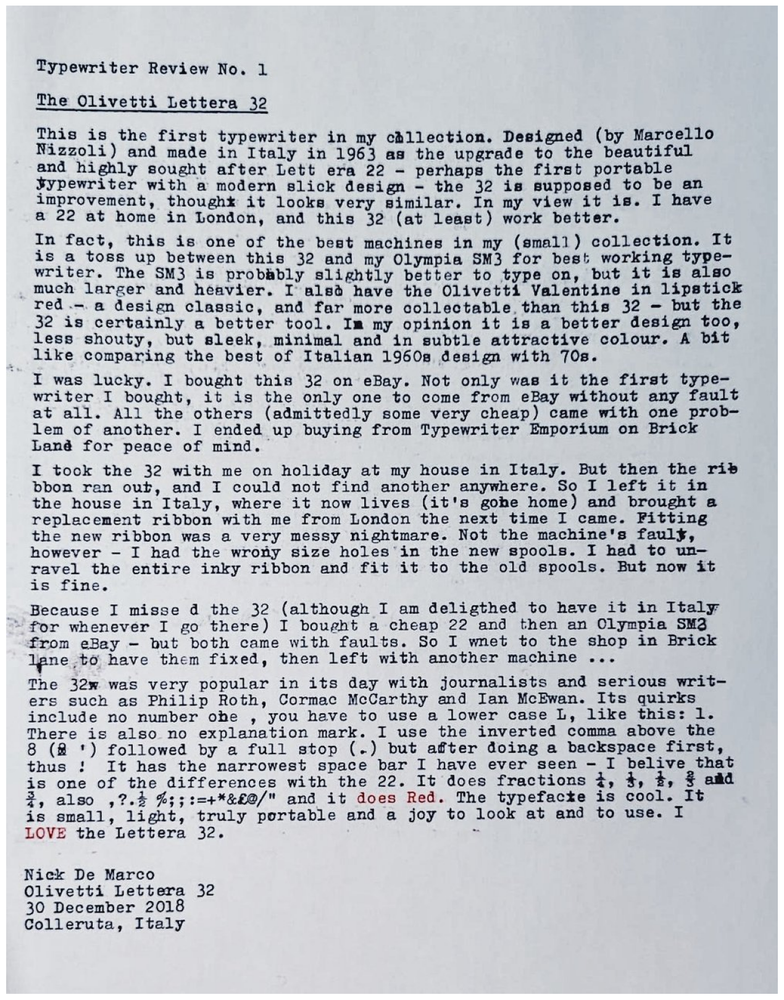

In [ ]:
display(image_file)

inverted images

In [ ]:
inverted_image = cv2.bitwise_not(img)
cv2.imwrite("temp/inverted.jpg", inverted_image)

True

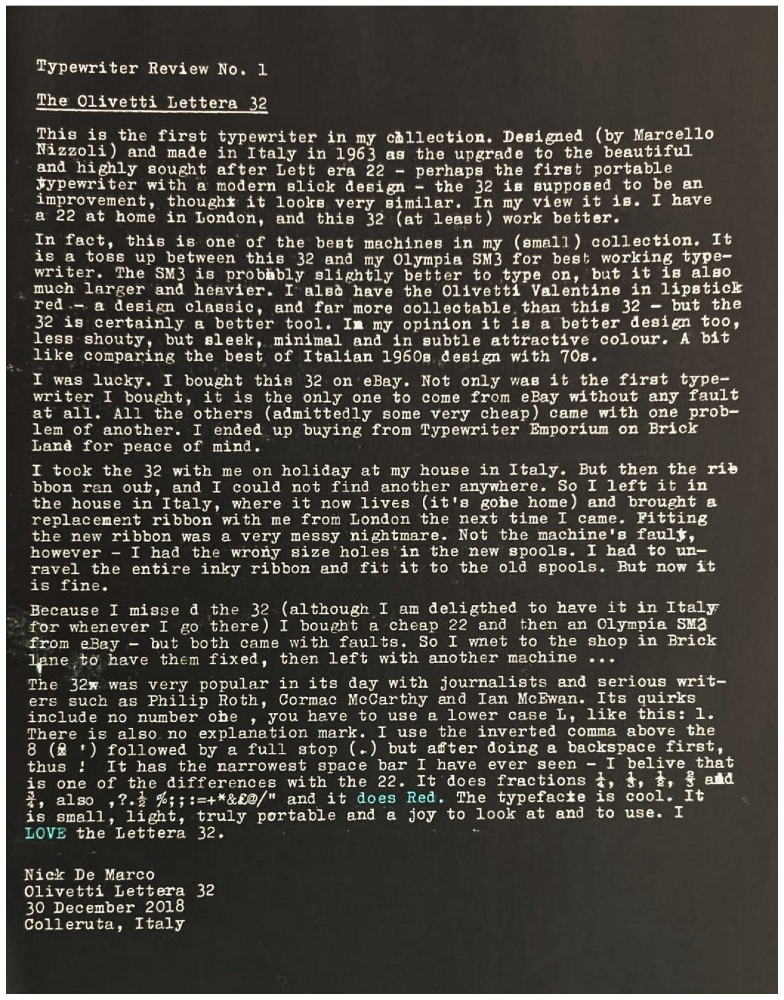

In [ ]:

display("temp/inverted.jpg")

binarization

In [ ]:
def grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [ ]:
gray_image = grayscale(img)
cv2.imwrite("temp/gray.jpg", gray_image)

True

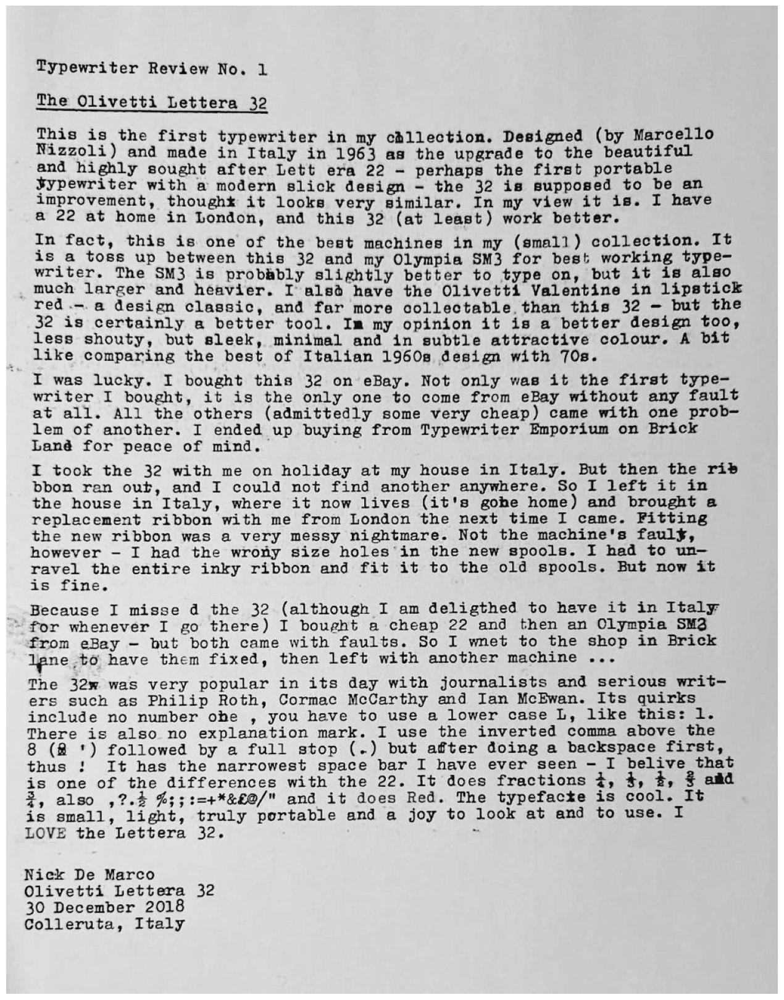

In [ ]:

display("temp/gray.jpg")

In [ ]:
thresh, im_bw = cv2.threshold(gray_image, 160, 210, cv2.THRESH_BINARY)
cv2.imwrite("temp/bw_image.jpg", im_bw)

True

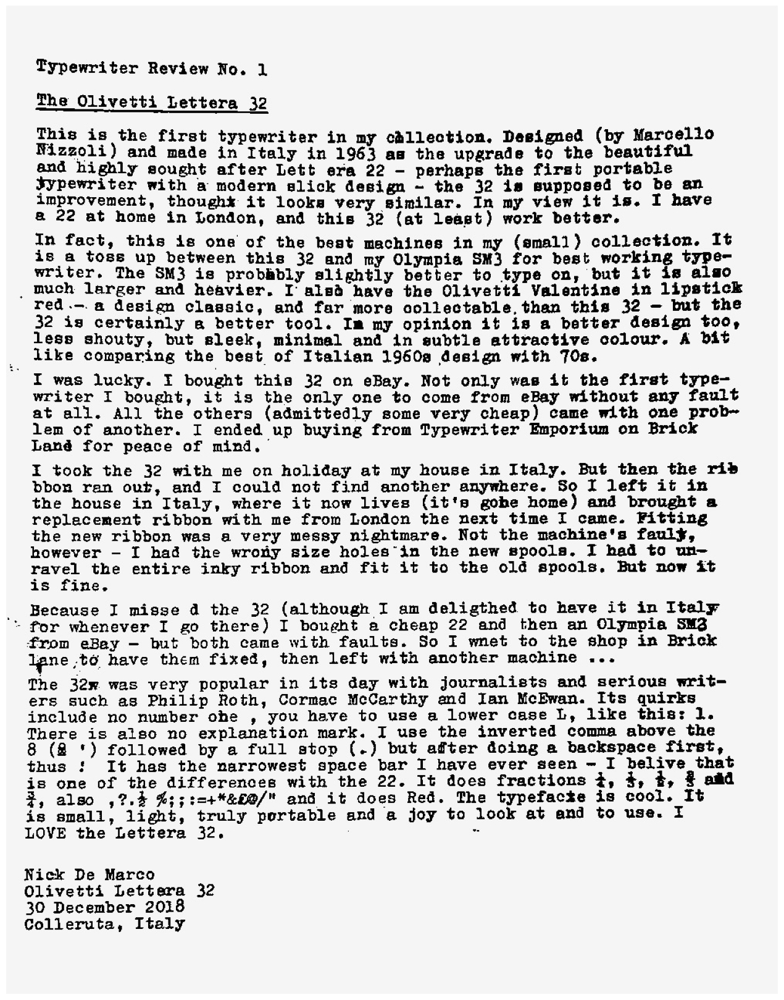

In [ ]:
display("temp/bw_image.jpg")

noise removal

In [ ]:
def noise_removal(image):
    import numpy as np
    kernel = np.ones((1, 1), np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    kernel = np.ones((1, 1), np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    image = cv2.medianBlur(image, 3)
    return (image)

In [ ]:
no_noise = noise_removal(im_bw)
cv2.imwrite("temp/no_noise.jpg", no_noise)

True

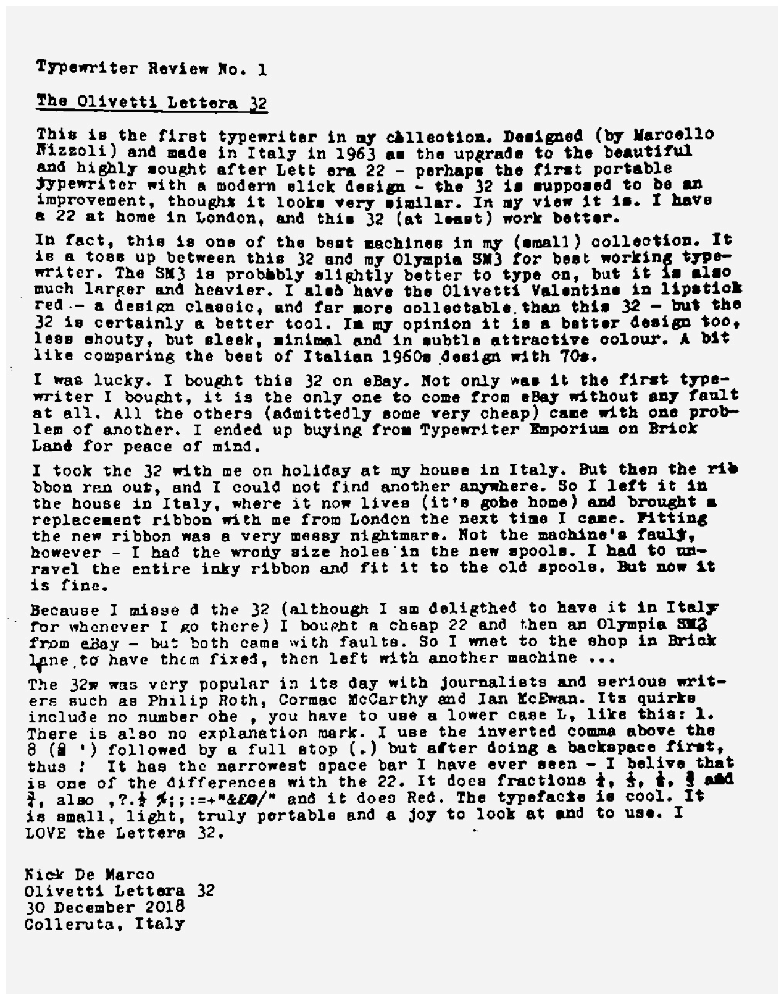

In [ ]:
display("temp/no_noise.jpg")

erosion

In [ ]:
def thin_font(image):
    import numpy as np
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2),np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)
    return (image)

In [ ]:
eroded_image = thin_font(no_noise)
cv2.imwrite("temp/eroded_image.jpg", eroded_image)

True

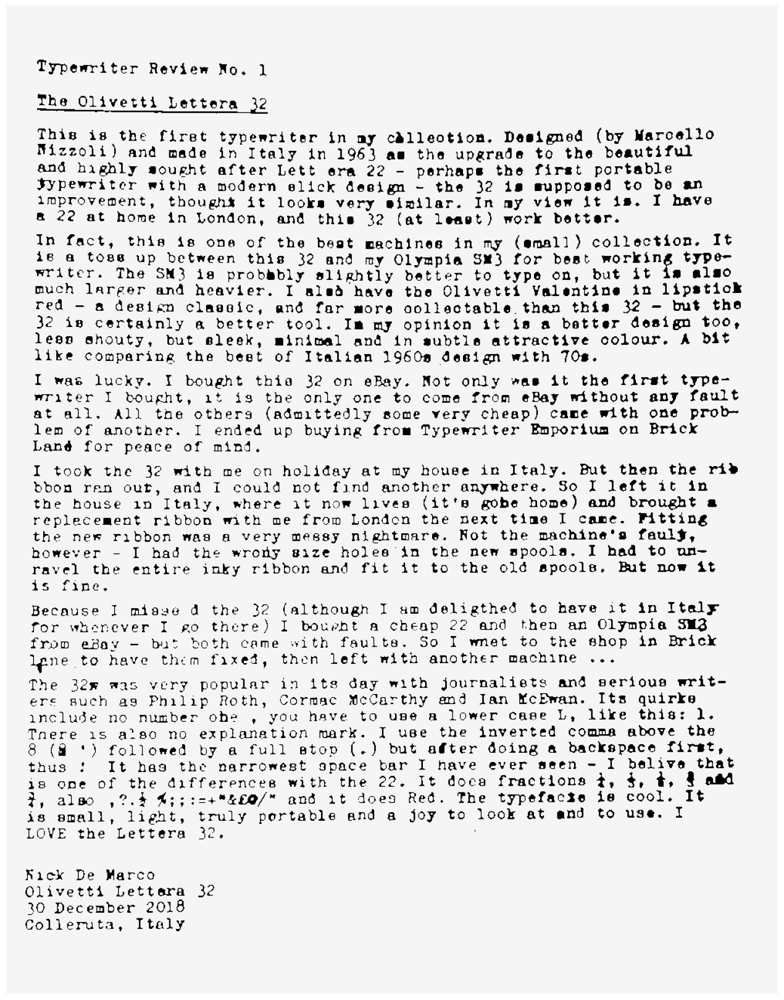

In [ ]:
display("temp/eroded_image.jpg")

dilation

In [ ]:
def thick_font(image):
    import numpy as np
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2),np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)
    return (image)

In [ ]:
dilated_image = thick_font(no_noise)
cv2.imwrite("temp/dilated_image.jpg", dilated_image)

True

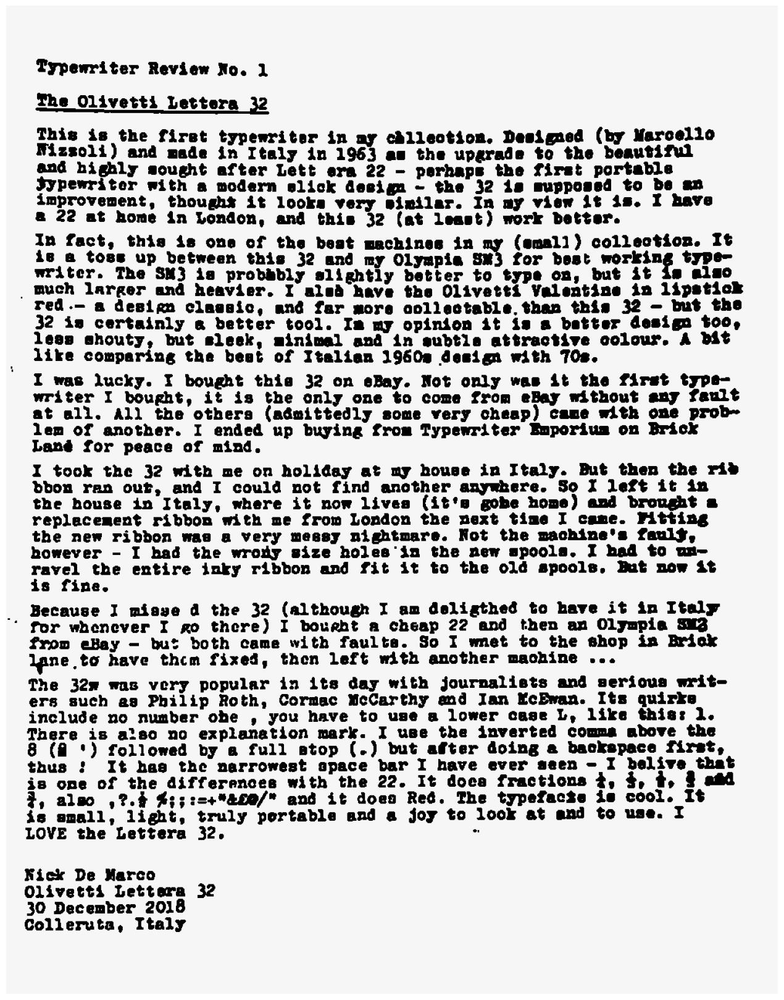

In [ ]:
display("temp/dilated_image.jpg")

pytesseract

In [ ]:
import pytesseract
!sudo apt install tesseract-ocr
from PIL import Image

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 49 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 1s (6,106 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debc

In [ ]:
img_file = "/content/01.jpg"
no_noise = "temp/no_noise.jpg"

In [ ]:
img = Image.open(no_noise)

In [ ]:
ocr_result = pytesseract.image_to_string(img)

In [ ]:
print(ocr_result)

Typewriter Review No. 1

The Olivetti Lettera 32

This is the firet typewriter in my chlleotion. Designed (by Marcello
Wizzoli) and made in Italy in 1963 as the upgrade to the beautiful
and highly sought after Lett era 22 perhaps the first portable
Sypewriter with a modern elick design - the 32 is supposed to de an
improvement, thought it looks very similar. In my view it is. I have
& 22 at home in London, and thie 32 (at least) work better.

In fact, this is one of the beat machines in my (small) collection. It
ie a toss up between this 32 and my Olympia SM3 for best moreso type-
writer. The SM3 ia probably slightly better to type on, but it is also
much larger and heavier. I aled have the Olivetti Valentine in lipstick
red.— a design classic, and far more collectable. than this 32 — but the
32 is certainly a better tool. Im my opinion it is a batter design too,
lees shouty, but sleek, minimal and in subtle attractive colour. A bit
like comparing the best of Italian 1960s design with 